In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import joblib
import os

# =========================================================
# CONFIGURACIÓN
# =========================================================
delta  = 0
stride = 5
window = 10
usar_solo_posicion = False
puntos_a_mantener  = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [27]:
# =========================================================
# RUTAS Y CONSTANTES A UTILIZAR
# =========================================================

os.chdir(r"/Users/piafrancisca/Desktop/Magister/cluster/rdocs/Videos_Movimiento_Barco_Feliciano/Modelo3D/Modelo Jonswap")
print(f"Directorio: {os.getcwd()}")

carpeta_features  = "Tracking_Features_ML_Color_v2"
carpeta_principal = "DATASET"
PX_PER_M    = 40.0   # Constante para pasar de pixel a metro
columnas_y = ['surge_px', 'heave_px', 'sway_m', 'rot_deg', 'yaw_deg', 'roll_deg']
columnas_y_m  = ['surge_m', 'heave_m', 'sway_m', 'rot_deg', 'yaw_deg', 'roll_deg']

carpetas_simulacion = [
    f"{carpeta_principal}/Dataset_Fase1_Tp6",
    f"{carpeta_principal}/Dataset_Fase1_Tp8",
    f"{carpeta_principal}/Dataset_Fase1_Tp10",
    f"{carpeta_principal}/Dataset_Fase1_Tp12",
    f"{carpeta_principal}/Dataset_Fase2_Tp6",
    f"{carpeta_principal}/Dataset_Fase2_Tp8",
    f"{carpeta_principal}/Dataset_Fase2_Tp10",
    f"{carpeta_principal}/Dataset_Fase2_Tp12",
    *[f"{carpeta_principal}/Dataset_Fase3_Hs{hs}_Tp{tp}_H{h}"
      for hs in [0.5, 1.5, 3.0, 5.0]
      for tp in [6, 8, 10, 12, 14]
      for h  in [0, 90, 135, 180]],
    f"{carpeta_principal}/Dataset_Fase4_Tp7",
    f"{carpeta_principal}/Dataset_Fase4_Tp9",
    f"{carpeta_principal}/Dataset_Fase4_Tp13",
    f"{carpeta_principal}/Dataset_Fase6_Tp7",
    f"{carpeta_principal}/Dataset_Fase6_Tp9",
    f"{carpeta_principal}/Dataset_Fase6_Tp11",
    f"{carpeta_principal}/Dataset_Fase6_Tp13",
    
]

VIDEOS_VALIDACION_EXTRA = {
    "video_Hs1.5_Tp8_H0_r2",     
    "video_Hs3.0_Tp10_H0_r2",    
    "video_Hs5.0_Tp12_H90_r2",   
}

carpetas_validacion = [
    f"{carpeta_principal}/Dataset_Fase4_Tp11",
    f"{carpeta_principal}/Dataset_Fase5_Tp7",
    f"{carpeta_principal}/Dataset_Fase5_Tp9",
    f"{carpeta_principal}/Dataset_Fase5_Tp11",
    f"{carpeta_principal}/Dataset_Fase5_Tp13",
]
# Videos excluidos: se analizó que habia demasiada oclusion
VIDEOS_EXCLUIDOS = {
    "video_Hs0.5_Tp6_H90_r0",  "video_Hs0.5_Tp6_H90_r1",  "video_Hs0.5_Tp6_H90_r2",
    "video_Hs0.5_Tp8_H90_r0",  "video_Hs0.5_Tp8_H90_r1",  "video_Hs0.5_Tp8_H90_r2",
    "video_Hs0.5_Tp10_H90_r0", "video_Hs0.5_Tp10_H90_r1", "video_Hs0.5_Tp10_H90_r2",
    "video_Hs0.5_Tp12_H90_r0", "video_Hs0.5_Tp12_H90_r1", "video_Hs0.5_Tp12_H90_r2",
    "video_Hs0.5_Tp14_H90_r0", "video_Hs0.5_Tp14_H90_r1", "video_Hs0.5_Tp14_H90_r2",
}


print(f"Features folder: {os.path.exists(carpeta_features)}")


Directorio: /Users/piafrancisca/Desktop/Magister/cluster/rdocs/Videos_Movimiento_Barco_Feliciano/Modelo3D/Modelo Jonswap
Features folder: True


In [29]:
# =========================================================
# INGENIERÍA DE FEATURES
# =========================================================

def enriquecer_features(df, px_per_m=40.0):
     # 0. Normalizamos px → unidades físicas metros
    # se dividen todas las velocidades/aceleraciones por px_per_m
    scale = 1.0 / px_per_m
    vel_cols = [c for c in df.columns
                if c.startswith(('v_p', 'a_p', 'v_cx', 'v_cy', 'a_cx', 'a_cy', 'vd_p'))]
    df[vel_cols] = df[vel_cols] * scale

    # 1. Velocidad relativa al centroide (discrimina rotación vs traslación)
    # vr_p{i}_y ≈ 0  →  punto se mueve con el cuerpo rígido (heave/surge)
    # vr_p{i}_y ≠ 0  →  punto tiene movimiento diferencial (rotación/deformación)
    if 'v_cx' in df.columns:
        for i in range(1, 13):
            df[f'vr_p{i}_x'] = df[f'v_p{i}_x'] - df['v_cx']
            df[f'vr_p{i}_y'] = df[f'v_p{i}_y'] - df['v_cy']

    # 2. Estadísticas globales por frame 
    vy_cols = [f'v_p{i}_y' for i in range(1, 13)]
    vx_cols = [f'v_p{i}_x' for i in range(1, 13)]

    # mean_vy: componente de heave puro (traslación vertical uniforme)
    df['mean_vy'] = df[vy_cols].mean(axis=1)
    # std_vy: componente de rotación/pitch (movimiento vertical diferencial)
    df['std_vy']  = df[vy_cols].std(axis=1)
    # mean_vx: componente de surge puro
    df['mean_vx'] = df[vx_cols].mean(axis=1)
    # std_vx: componente de yaw (movimiento horizontal diferencial)
    df['std_vx']  = df[vx_cols].std(axis=1)

    # 3. Asimetría izq/der en velocidad vertical → pitch
    left_vy  = df[[f'v_p{i}_y' for i in [1, 2, 5, 6]]].mean(axis=1)   # col izquierda
    right_vy = df[[f'v_p{i}_y' for i in [3, 4, 8, 9]]].mean(axis=1)   # col derecha
    df['asym_vy_lr'] = left_vy - right_vy

    # Asimetría arriba/abajo en velocidad horizontal → roll
    top_vx    = df[[f'v_p{i}_x' for i in [1, 2, 3, 4]]].mean(axis=1)   # fila top ✓
    bottom_vx = df[[f'v_p{i}_x' for i in [10, 11, 12]]].mean(axis=1)   # fila bottom (sin p9)
    df['asym_vx_tb'] = top_vx - bottom_vx
   

    # 4. Escala relativa de distancias
    # Durante sway (zoom): todas las distancias crecen/decrecen juntas
    # Durante yaw: distancias horizontales cambian, verticales no
    if 'd_p1_p4' in df.columns and 'd_p1_p9' in df.columns:
        df['ratio_dist_hz_vt'] = df['d_p1_p4'] / (df['d_p1_p9'] + 1e-6)
        df['vd_ratio_hz_vt']   = df['ratio_dist_hz_vt'].diff()

    # 5. Contexto temporal (90 frames = 3s de lookback)
    ROLL = 90
    if 'v_cy' in df.columns:
        df['cum_disp_y']   = df['v_cy'].rolling(ROLL, min_periods=1).sum()
        df['cum_disp_x']   = df['v_cx'].rolling(ROLL, min_periods=1).sum()
        df['roll_max_vy']  = df['v_cy'].rolling(ROLL, min_periods=1).max()
        df['roll_min_vy']  = df['v_cy'].rolling(ROLL, min_periods=1).min()
        df['roll_amp_vy']  = df['roll_max_vy'] - df['roll_min_vy']
        df['roll_max_vx']  = df['v_cx'].rolling(ROLL, min_periods=1).max()
        df['roll_min_vx']  = df['v_cx'].rolling(ROLL, min_periods=1).min()
        df['roll_amp_vx']  = df['roll_max_vx'] - df['roll_min_vx']
        df['phase_proxy_y'] = df['cum_disp_y'] / (df['roll_amp_vy'] + 1e-6)
        df['phase_proxy_x'] = df['cum_disp_x'] / (df['roll_amp_vx'] + 1e-6)
    if 'a_cy' in df.columns:
        df['roll_mean_acy'] = df['a_cy'].rolling(ROLL, min_periods=1).mean()
        df['roll_mean_acx'] = df['a_cx'].rolling(ROLL, min_periods=1).mean()


    # 6. Discriminador surge vs pitch 
    # para pitch, punto 1 (extremo) y punto 12 (opuesto) tienen velocidades relativas CONTRARIAS → diferencia grande
    # para surge, todos van igual → vr_p{i}_x ≈ 0 → diferencia ≈ 0
    ROLL_R = 90
    if 'vr_p1_x' in df.columns and 'vr_p12_x' in df.columns:
        df['rot_proxy_x']       = df['vr_p1_x'] - df['vr_p12_x']
        df['cum_rot_proxy_x']   = df['rot_proxy_x'].rolling(ROLL_R, min_periods=1).sum()
        df['roll_amp_rot_proxy'] = (
            df['rot_proxy_x'].rolling(ROLL_R, min_periods=1).max() -
            df['rot_proxy_x'].rolling(ROLL_R, min_periods=1).min()
        )


   # 7. Deformación espacial entre grupos de puntos
    # CÓMO cambian las distancias entre grupos de puntos que tenemos

    # Pares importantes
    #   vd_p1_p4   = velocidad del ancho superior
    #   vd_p9_p12  = velocidad del span inferior
    #   vd_p1_p12  = diagonal cruzada izq
    #   vd_p3_p10  = diagonal cruzada der
    ROLL_S = 90
    vd_all = [c for c in df.columns if c.startswith('vd_p')]
    if len(vd_all) >= 2:
        # SWAY: todos los pares cambian de la misma forma → media global
        df['vd_global_mean'] = df[vd_all].mean(axis=1)
        # ASIMETRÍA: si solo algunos pares cambian → yaw/roll/pitch
        df['vd_global_std']  = df[vd_all].std(axis=1)
        df['cum_vd_global_mean'] = df['vd_global_mean'].rolling(ROLL_S, min_periods=1).sum()
        df['cum_vd_global_std']  = df['vd_global_std'].rolling(ROLL_S, min_periods=1).sum()

    if 'vd_p1_p12' in df.columns and 'vd_p3_p10' in df.columns:
        # YAW: diagonales cruzadas cambian en SENTIDOS OPUESTOS bajo perspectiva
        df['cross_diag_diff'] = df['vd_p1_p12'] - df['vd_p3_p10']
        df['cum_cross_diag_diff'] = df['cross_diag_diff'].rolling(ROLL_S, min_periods=1).sum()

    if 'vd_p1_p4' in df.columns and 'vd_p9_p12' in df.columns:
        # ROLL: ancho superior vs ancho inferior cambian diferente bajo
        df['top_bottom_span_diff'] = df['vd_p1_p4'] - df['vd_p9_p12']
        df['cum_top_bottom_span_diff'] = df['top_bottom_span_diff'].rolling(ROLL_S, min_periods=1).sum()

    return df


def seleccionar_columnas_X(columnas_X, puntos_a_mantener, usar_solo_posicion):

    cols_puntos = []
    for p in puntos_a_mantener:
        cols_puntos += [c for c in columnas_X
                        if (c.startswith(f'v_p{p}_') or c.startswith(f'a_p{p}_'))
                           and '_area' not in c]
    cols_dist = [c for c in columnas_X if c.startswith('vd_p')]
    cols_centroide = [c for c in columnas_X if c.startswith(('v_cx', 'v_cy', 'a_cx', 'a_cy'))]
    cols_velrel = [c for c in columnas_X if c.startswith('vr_p')]
    cols_stats = [c for c in columnas_X if c in
                  ('mean_vy', 'std_vy', 'mean_vx', 'std_vx',
                   'asym_vy_lr', 'asym_vx_tb',
                   'area_lr_ratio', 'area_tb_ratio',
                   'v_area_lr_ratio', 'v_area_tb_ratio',
                   'ratio_dist_hz_vt', 'vd_ratio_hz_vt',
                   'cum_disp_y', 'cum_disp_x',
                   'roll_amp_vy', 'roll_amp_vx',
                   'phase_proxy_y', 'phase_proxy_x',
                   'roll_mean_acy', 'roll_mean_acx',
                   'cum_rot_proxy_x', 'roll_amp_rot_proxy',
                   'vd_global_mean', 'vd_global_std',
                   'cum_vd_global_mean', 'cum_vd_global_std',
                   'cross_diag_diff', 'cum_cross_diag_diff',
                   'top_bottom_span_diff', 'cum_top_bottom_span_diff')]

    vistas, todas = set(), []
    for c in (cols_puntos + cols_dist + cols_centroide + cols_velrel + cols_stats):
        if c not in vistas:
            todas.append(c)
            vistas.add(c)
    return todas


print("Ingeniería de features definida")


Ingeniería de features definida


In [ ]:
# =========================================================
# CARGA DE DATOS
# =========================================================

all_train_X, all_train_y = [], []
datos_prueba = {}

archivos_feat = [f for f in os.listdir(carpeta_features) if f.startswith("feat_")]
print(f"Archivos de features: {len(archivos_feat)}")

for f_feat in archivos_feat:
    nombre_base = f_feat.replace("feat_", "").replace(".csv", "")
    if nombre_base in VIDEOS_EXCLUIDOS:
        continue   
    path_feat   = os.path.join(carpeta_features, f_feat)
    path_sim, es_validacion = None, False

    if nombre_base in VIDEOS_VALIDACION_EXTRA:
        for hs in [0.5,1.5,3.0,5.0]:
            for tp in [6,8,10,12,14]:
                for h in [0,90,135,180]:
                    p = os.path.join(carpeta_principal,
                                     f"Dataset_Fase3_Hs{hs}_Tp{tp}_H{h}",
                                     f"{nombre_base}.csv")
                    if os.path.exists(p):
                        path_sim, es_validacion = p, True; break
                if path_sim: break
            if path_sim: break
    if not path_sim:
        for carpeta in carpetas_simulacion:
            posible = os.path.join(carpeta, f"{nombre_base}.csv")
            if os.path.exists(posible):
                path_sim = posible; break
    if not path_sim:
        for carpeta in carpetas_validacion:
            posible = os.path.join(carpeta, f"{nombre_base}.csv")
            if os.path.exists(posible):
                path_sim, es_validacion = posible, True; break
    if not path_sim:
        continue

    df_feat = pd.read_csv(path_feat)
    df_sim  = pd.read_csv(path_sim)
    df_feat = enriquecer_features(df_feat, px_per_m=PX_PER_M)

   # Convertir etiqueta a unidades físicas, se utiliza parametro de conversion
   # ojo sway ya está en metros. Rotaciones ya están en grados.
    if 'surge_px' in df_sim.columns:
        df_sim['surge_m'] = df_sim['surge_px'] / PX_PER_M
    if 'heave_px' in df_sim.columns:
        df_sim['heave_m'] = df_sim['heave_px'] / PX_PER_M
    

    df_feat['tiempo'] = df_feat['tiempo'].round(3)
    df_sim['time_s']  = df_sim['time_s'].round(3)
    df_unido = pd.merge_asof(
        df_feat.sort_values('tiempo'),
        df_sim.sort_values('time_s'),
        left_on='tiempo', right_on='time_s', direction='nearest'
    )
    if delta > 0:
        df_unido[columnas_y_m] = df_unido[columnas_y_m].shift(-delta)
    df_unido = df_unido.dropna().reset_index(drop=True)

    columnas_X_all = [c for c in df_unido.columns
                      if c not in columnas_y_m and c not in columnas_y
                         and c not in ['tiempo', 'time_s']]
    columnas_X_red = seleccionar_columnas_X(columnas_X_all, puntos_a_mantener, usar_solo_posicion)

    X_base, y_base = df_unido[columnas_X_red].values, df_unido[columnas_y_m].values
    tiempo_base    = df_unido['tiempo'].values

    X_windows, y_windows = [], []
    for i in range(window, len(X_base), stride):
        X_windows.append(X_base[i-window:i].flatten())
        y_windows.append(y_base[i])
    if not X_windows:
        continue

    X_windows  = np.array(X_windows)
    y_windows  = np.array(y_windows)
    tiempo_win = tiempo_base[window::stride][:len(y_windows)]

    if es_validacion:
        datos_prueba[nombre_base] = {'X': X_windows, 'y': y_windows, 'tiempo': tiempo_win}
    else:
        all_train_X.append(X_windows)
        all_train_y.append(y_windows)

X_train_raw = np.vstack(all_train_X)
y_train     = np.vstack(all_train_y)

scaler  = StandardScaler()
X_train = scaler.fit_transform(X_train_raw)

print(f"Entrenamiento: {X_train.shape}")
print(f"Features/muestra: {X_train.shape[1]}")
print(f"Videos validación: {len(datos_prueba)}")


Archivos de features: 668


/var/folders/6h/2rmw0n_x6lg80qzrrxchfxgh0000gn/T/ipykernel_12886/33033153.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'vr_p{i}_x'] = df[f'v_p{i}_x'] - df['v_cx']
/var/folders/6h/2rmw0n_x6lg80qzrrxchfxgh0000gn/T/ipykernel_12886/33033153.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'vr_p{i}_y'] = df[f'v_p{i}_y'] - df['v_cy']
/var/folders/6h/2rmw0n_x6lg80qzrrxchfxgh0000gn/T/ipykernel_12886/33033153.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.inser

In [ ]:
# =========================================================
# DIAGNÓSTICO: verificar que no hay mismatch post-corrección
# =========================================================
import numpy as np

if all_train_X and datos_prueba:
    X_train_diag = np.vstack(all_train_X)
    # Escoger un video de validación de heave puro
    vid_diag = next((k for k in datos_prueba if 'heave' in k), list(datos_prueba.keys())[0])
    X_val_diag = datos_prueba[vid_diag]['X']
    
    # Calcular z-scores feature por feature
    mu = X_train_diag.mean(axis=0)
    sg = X_train_diag.std(axis=0) + 1e-10
    z  = (X_val_diag.mean(axis=0) - mu) / sg
    
    print(f"=== Z-SCORES VAL vs TRAIN (video: {vid_diag}) ===")
    print(f"  max |z|   = {np.abs(z).max():.1f}σ  (antes era >1857σ)")
    print(f"  |z| > 10σ = {(np.abs(z) > 10).sum()} features  (antes eran decenas)")
    print(f"  |z| > 3σ  = {(np.abs(z) > 3).sum()} features")
    print(f"  Total features: {len(z)}")
    if np.abs(z).max() < 20:
        print("  ✅ Features en distribución razonable — modelo puede operar correctamente")
    else:
        # Show worst offenders
        worst = np.argsort(np.abs(z))[-5:][::-1]
        # Need feature names
        vid0 = list(datos_prueba.keys())[0]
        df_tmp = pd.read_csv(os.path.join(carpeta_features, f"feat_{vid0}.csv"))
        df_tmp = enriquecer_features(df_tmp)
        cols_all = [c for c in df_tmp.columns if c not in columnas_y and c not in ['tiempo','time_s']]
        cols_red = seleccionar_columnas_X(cols_all, puntos_a_mantener, usar_solo_posicion)
        feat_names_flat = [f"{c}_t{j}" for j in range(window) for c in cols_red]
        if len(feat_names_flat) == len(z):
            print("  ⚠️  Peores features:")
            for idx in worst:
                print(f"    {feat_names_flat[idx]}: z={z[idx]:.1f}σ")
        else:
            print(f"  ⚠️  Features con |z|>10: índices {worst}")
else:
    print("Correr primero las celdas de carga (cell-04)")


=== Z-SCORES VAL vs TRAIN (video: video_Heave_Pitch_9_4.0_4.0) ===
  max |z|   = 7.6σ  (antes era >1857σ)
  |z| > 10σ = 0 features  (antes eran decenas)
  |z| > 3σ  = 10 features
  Total features: 1180
  ✅ Features en distribución razonable — modelo puede operar correctamente


In [16]:
# =========================================================
# ENTRENAMIENTO RF
# =========================================================

modelo = RandomForestRegressor(
    n_estimators=100,
    max_depth=15,
    max_features="sqrt",
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)
modelo.fit(X_train, y_train)

nombre_modelo = f"modelo_v3_{len(puntos_a_mantener)}pts.pkl"
joblib.dump((modelo, scaler), nombre_modelo)
print(f"Modelo v3 guardado: {nombre_modelo}")
print(f"Outputs: {modelo.n_outputs_}")


Modelo v3 guardado: modelo_v3_12pts.pkl
Outputs: 6


In [17]:
# =========================================================
# FUNCIONES DE EVALUACIÓN
# =========================================================

def willmott(y_true, y_pred):
    mean = np.mean(y_true)
    num  = np.sum((y_true - y_pred)**2)
    den  = np.sum((np.abs(y_pred - mean) + np.abs(y_true - mean))**2)
    return 1 - num/den if den != 0 else 0

def predecir(video_nombre):
    datos  = datos_prueba[video_nombre]
    X_sc   = scaler.transform(datos['X'])
    y_pred = modelo.predict(X_sc)
    return datos['y'], y_pred, datos['tiempo']

def graficar_video(video_nombre, zoom_start=1000, zoom_end=1500):
    nombres = ["Surge", "Heave", "Sway", "Pitch", "Yaw", "Roll"]
    y_test, y_pred, t = predecir(video_nombre)
    fig, axes = plt.subplots(3, 2, figsize=(14, 10))
    axes = axes.ravel()
    for i in range(6):
        rmse = np.sqrt(mean_squared_error(y_test[:, i], y_pred[:, i]))
        w    = willmott(y_test[:, i], y_pred[:, i])
        axes[i].plot(t, y_test[:, i], 'k',   label="Real")
        axes[i].plot(t, y_pred[:, i], 'r--', label="Pred")
        axes[i].set_title(f"{nombres[i]} | RMSE={rmse:.3f} | W={w:.3f}")
        axes[i].grid(True); axes[i].legend()
    plt.suptitle(video_nombre, fontsize=11); plt.tight_layout(); plt.show()

    s, e = zoom_start, min(zoom_end, len(t))
    fig2, axes2 = plt.subplots(3, 2, figsize=(14, 10))
    axes2 = axes2.ravel()
    for i in range(6):
        axes2[i].plot(t[s:e], y_test[s:e, i], 'k',   label="Real")
        axes2[i].plot(t[s:e], y_pred[s:e, i], 'r--', label="Pred")
        axes2[i].set_title(f"{nombres[i]} (zoom)")
        axes2[i].grid(True); axes2[i].legend()
    plt.suptitle(f"Zoom: {video_nombre}", fontsize=11); plt.tight_layout(); plt.show()

print("Listo. Usa: graficar_video('nombre_video')")


Listo. Usa: graficar_video('nombre_video')


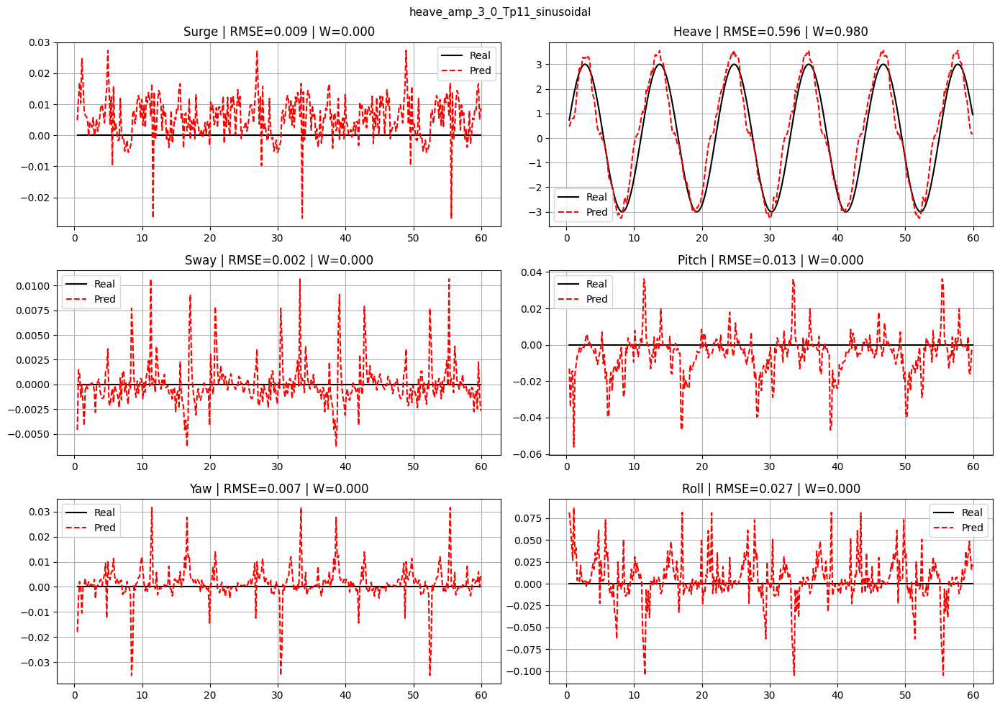

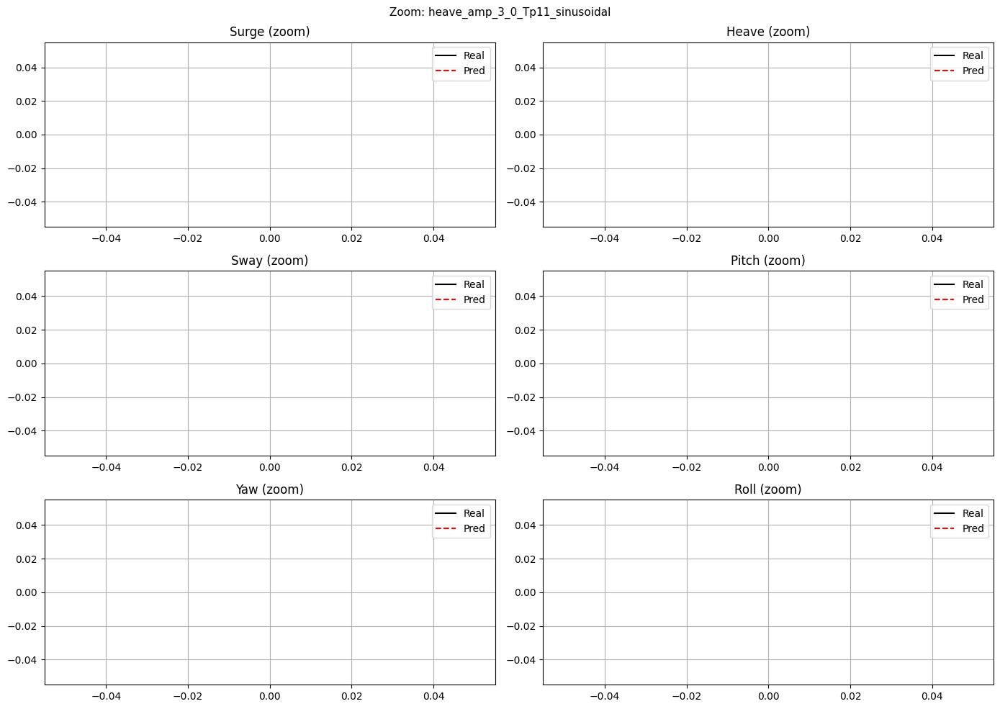

In [19]:
video_test = "heave_amp_3_0_Tp11_sinusoidal"
if video_test in datos_prueba:
    graficar_video(video_test)
else:
    print(f"No encontrado: {video_test}")
    print("Disponibles:", list(datos_prueba.keys())[:10])


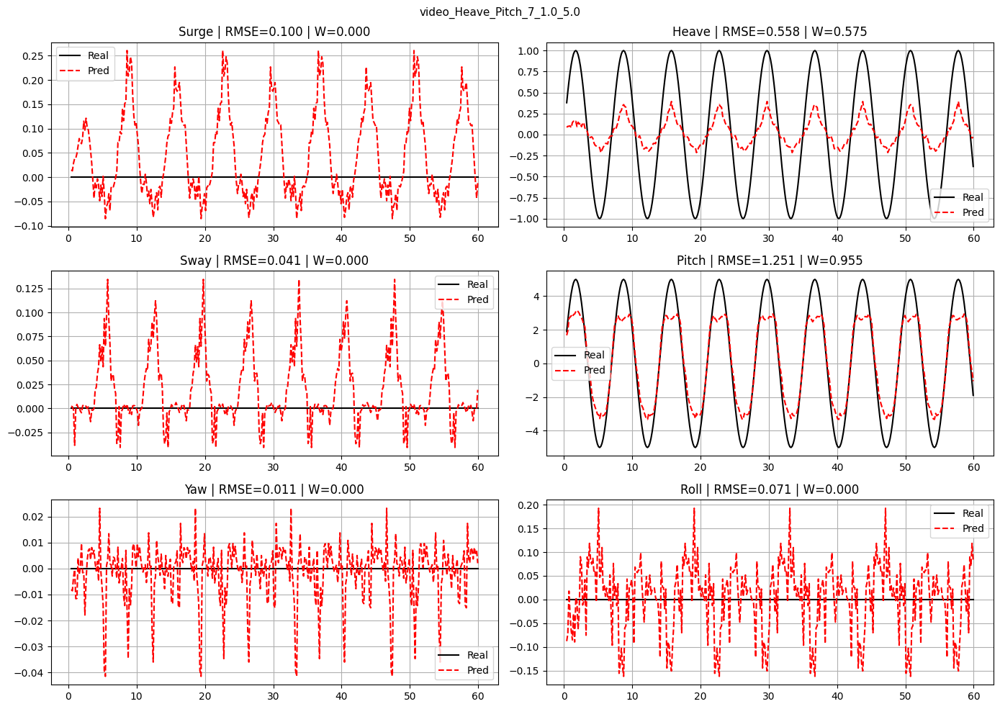

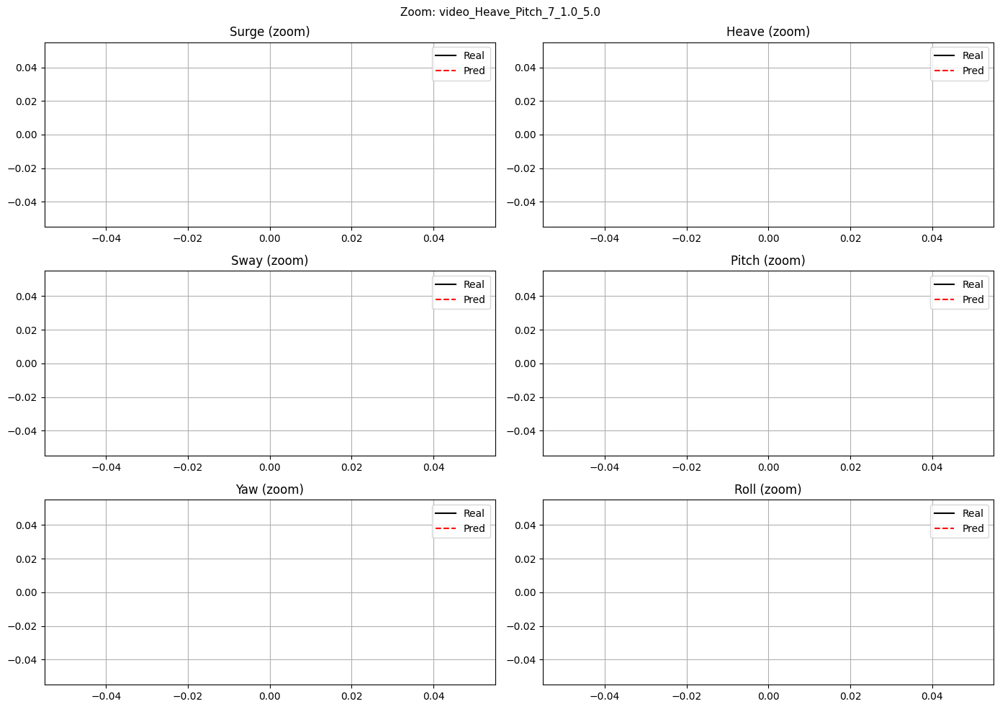

In [20]:
# =========================================================
# VALIDACIÓN — casos 2-DOF acoplados (Fase 5)
# =========================================================
video_test = "video_Heave_Pitch_7_1.0_5.0"
if video_test in datos_prueba:
    graficar_video(video_test)
else:
    print(f"No encontrado: {video_test}")


In [21]:
# =========================================================
# RESUMEN GLOBAL
# =========================================================

nombres_dof = ["Surge", "Heave", "Sway", "Pitch", "Yaw", "Roll"]
resultados  = []
for vid_name in sorted(datos_prueba.keys()):
    y_test, y_pred, _ = predecir(vid_name)
    fila = {'video': vid_name}
    for i, dof in enumerate(nombres_dof):
        fila[f'RMSE_{dof}'] = round(np.sqrt(mean_squared_error(y_test[:, i], y_pred[:, i])), 4)
        fila[f'W_{dof}']    = round(willmott(y_test[:, i], y_pred[:, i]), 4)
    resultados.append(fila)

df_res = pd.DataFrame(resultados)
print("=== RMSE promedio ===")
for dof in nombres_dof:
    print(f"  {dof:7s}: {df_res[f'RMSE_{dof}'].mean():.4f} ± {df_res[f'RMSE_{dof}'].std():.4f}")
print("\n=== Willmott promedio ===")
for dof in nombres_dof:
    print(f"  {dof:7s}: {df_res[f'W_{dof}'].mean():.4f} ± {df_res[f'W_{dof}'].std():.4f}")
df_res.to_csv("resultados_validacion_v3.csv", index=False)
print("\nGuardado: resultados_validacion_v3.csv")


=== RMSE promedio ===
  Surge  : 0.3824 ± 0.7032
  Heave  : 0.3886 ± 0.7061
  Sway   : 0.3058 ± 0.5296
  Pitch  : 0.2881 ± 0.4952
  Yaw    : 0.4630 ± 0.8827
  Roll   : 0.5923 ± 0.7874

=== Willmott promedio ===
  Surge  : 0.2402 ± 0.3690
  Heave  : 0.2303 ± 0.3523
  Sway   : 0.2654 ± 0.4077
  Pitch  : 0.2798 ± 0.4136
  Yaw    : 0.1295 ± 0.2227
  Roll   : 0.2115 ± 0.3396

Guardado: resultados_validacion_v3.csv
